In [3]:
import sys
sys.path.append("../utils")
from plot_utils import plot_spatial

In [4]:
from dataloader_utils import get_index_from_colnames
import numpy as np
from compute_omega import compute_omega, get_pmid_from_x

In [5]:

pconst = np.load("../consts/phys_consts.npz")
col_names = np.loadtxt("../analysis/test_data/col_names.txt", dtype=str)
hyam = pconst["hyam"]
hybm = pconst["hybm"]
sample_file = np.load("../analysis/test_data/08689.npy")
print(sample_file.shape)
ps_idx = get_index_from_colnames(col_names, "SPPS")
print(ps_idx)
ps = sample_file[ps_idx[0]:ps_idx[1]].squeeze()
pmid = get_pmid_from_x(ps, hyam, hybm)
u_idx = get_index_from_colnames(col_names, "UL")
v_idx = get_index_from_colnames(col_names, "VL")
u = sample_file[u_idx[0]:u_idx[1]]
v = sample_file[v_idx[0]:v_idx[1]]
print("u:", u.shape)
print("v:", v.shape)
print("pmid:", pmid.shape)
# u = np.random.rand(10, 5, 5)  # Random u component
# v = np.random.rand(10, 5, 5)  # Random v component
# pressure_levels = np.linspace(1000, 100, 10)  # Pressure levels from 1000 hPa to 100 hPa
# longitude = np.linspace(0, 360, 5)  # Longitude from 0 to 360 degrees
# latitude = np.linspace(-90, 90, 5)  # Latitude from -90 to 90 degrees
lon = np.linspace(0,357.5,144)
lat = np.linspace(-90,90,96)

omega = compute_omega(u, v, pmid, lon, lat)

(803, 96, 144)
(232, 233)
u: (30, 96, 144)
v: (30, 96, 144)
pmid: (30, 96, 144)
lon_rad gradient: (144,)
cos(lat_rad): (96,)
dx: (1, 96, 144)
dy: (96, 1)
dp: (30, 96, 144)
du_dx: (30, 96, 144)
dv_dy: (30, 96, 144)
omega: (31, 96, 144)


In [6]:
import numpy as np
levs = np.array([
    3.64346569,   7.59481965,  14.35663225,  24.61222,     38.26829977,
      54.59547974,  72.01245055,  87.82123029, 103.31712663, 121.54724076,
       142.99403876, 168.22507977, 197.9080867,  232.82861896, 273.91081676,
        322.24190235, 379.10090387, 445.9925741,  524.68717471, 609.77869481,
         691.38943031, 763.40448111, 820.85836865, 859.53476653, 887.02024892,
          912.64454694, 936.19839847, 957.48547954, 976.32540739, 992.55609512]).astype(int)


In [7]:
!pwd

/Users/jiandachen/Projects/NNCAM_packages/nncam_training/dataloader


In [8]:
ann_omega = np.load("test_omega_sample12_omega_means.npy")

In [9]:
import cartopy.crs as ccrs
from cartopy.feature import COASTLINE
import matplotlib.pyplot as plt

In [16]:
ann_omega_converted = 86400*ann_omega/100

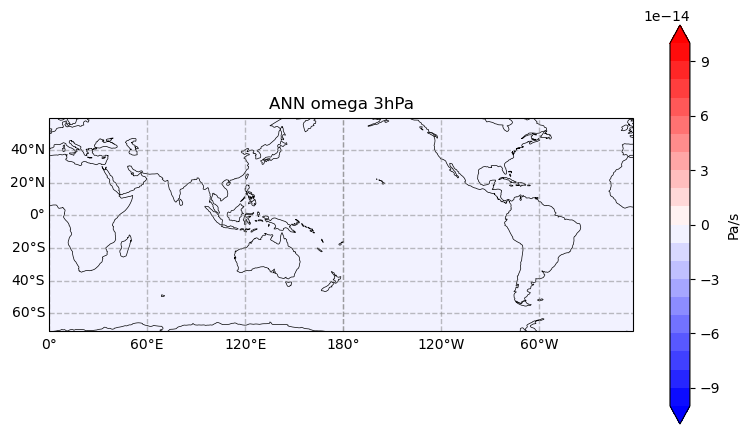

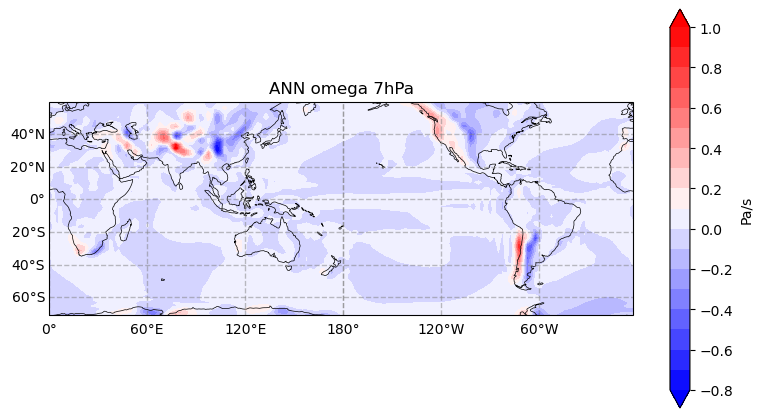

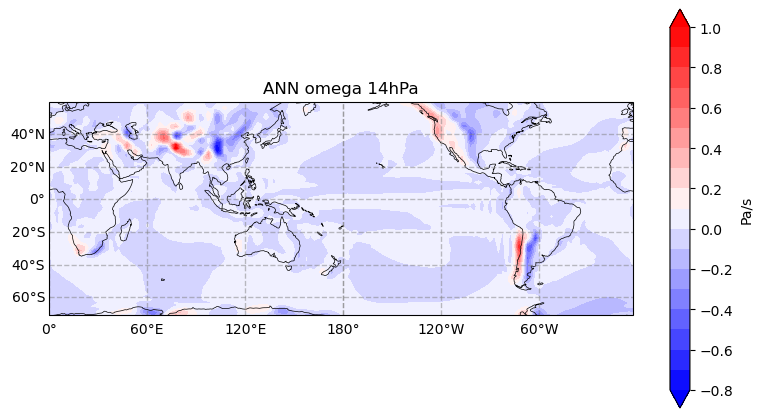

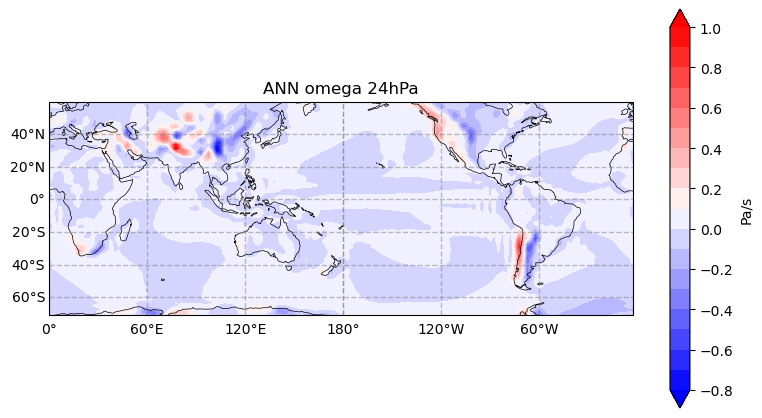

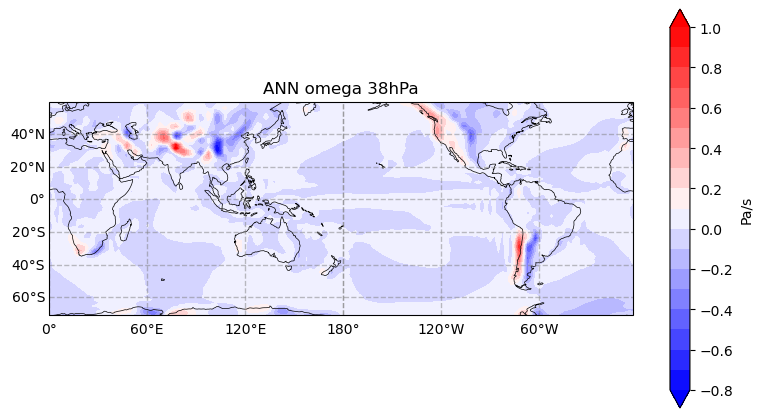

...

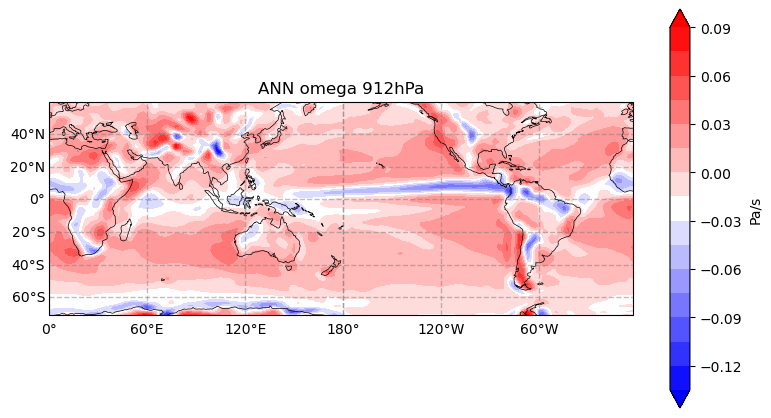

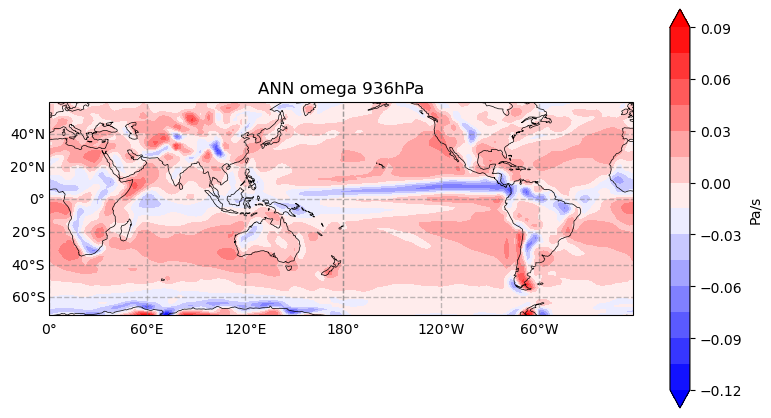

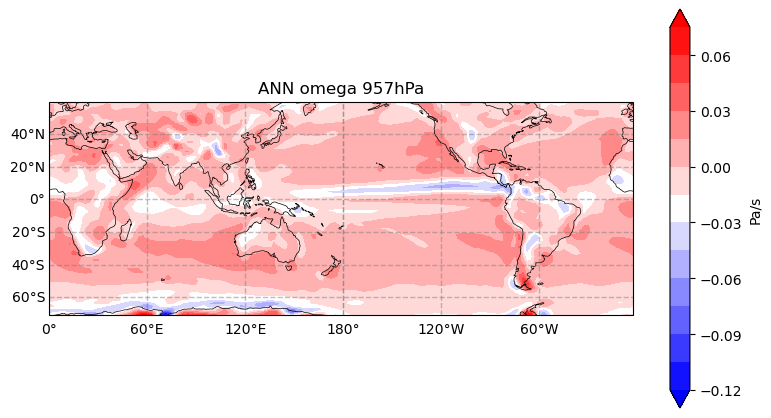

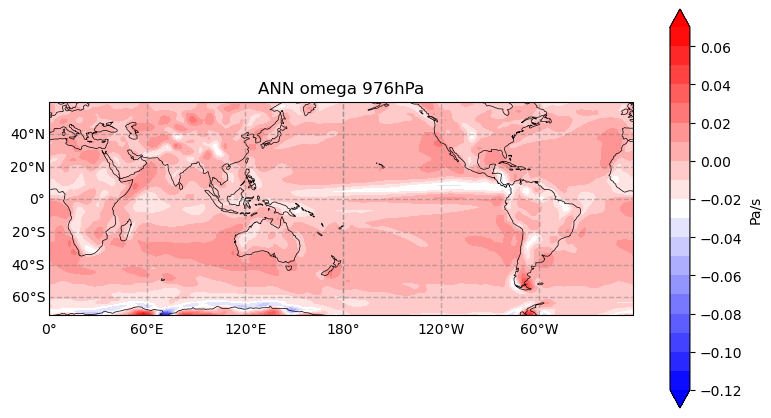

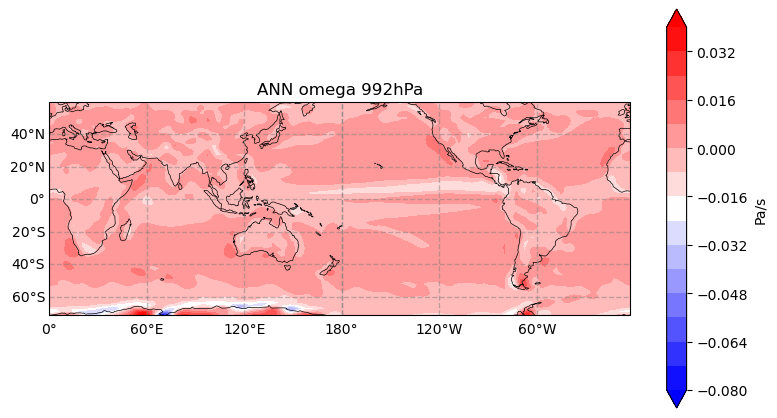

In [15]:
for i in range(0,30):
    fig, ax = plt.subplots(1,1,figsize=(8,6),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    ax.set_title(f"ANN omega {levs[i]:.0f}hPa")
    plot_spatial(lon, lat[10:80], ann_omega[i,10:80], ax=ax, cbar_label="Pa/s")
    plt.tight_layout()
    plt.show()

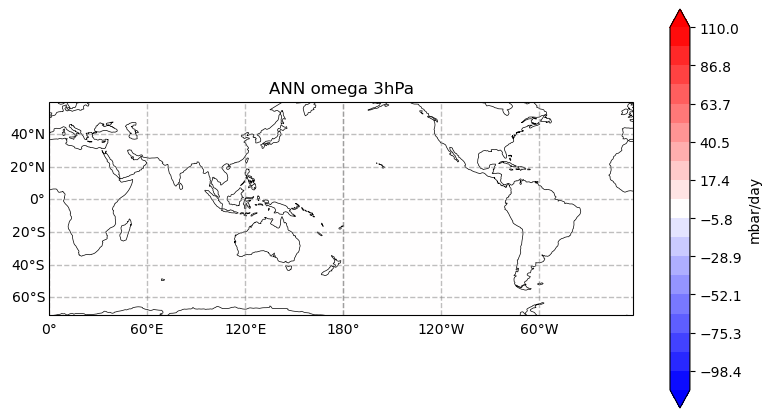

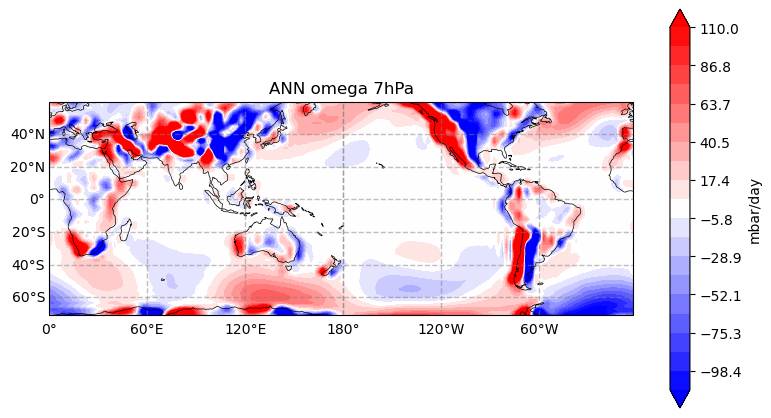

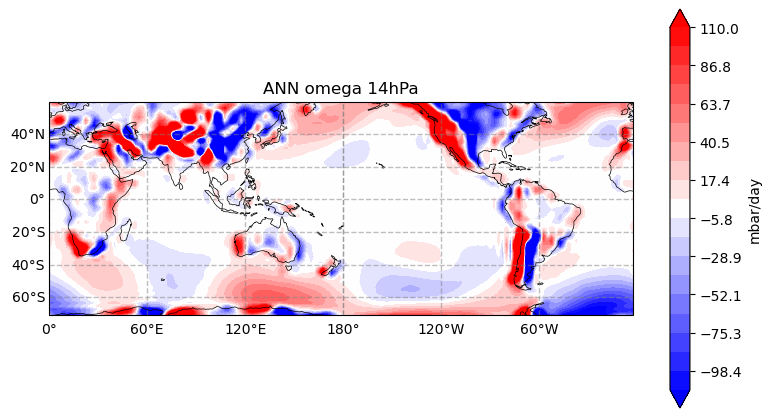

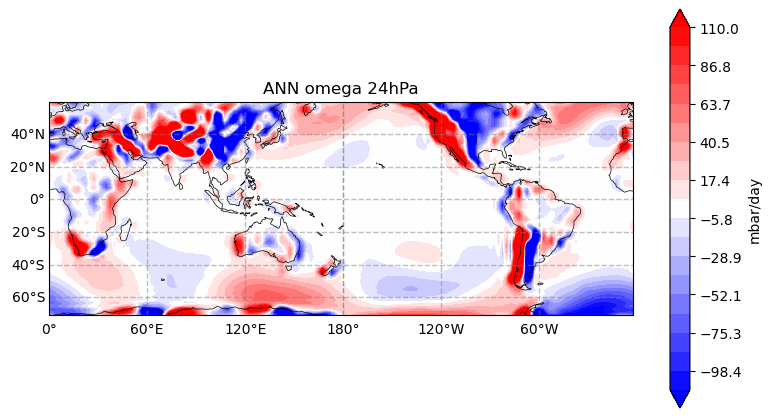

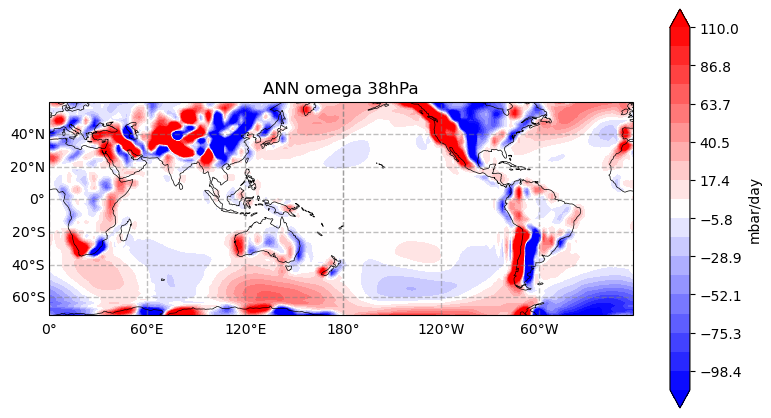

...

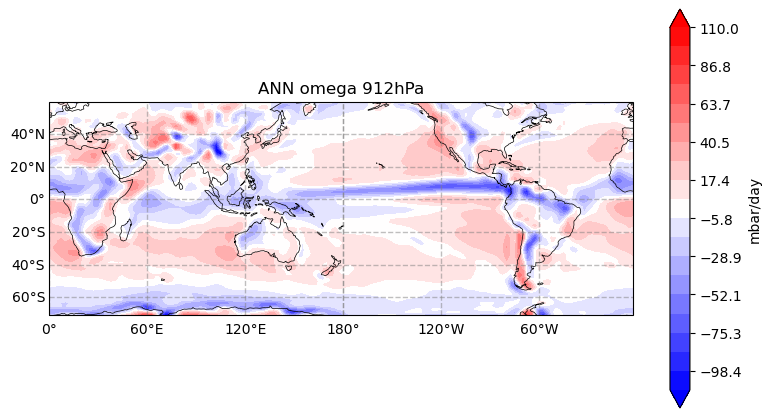

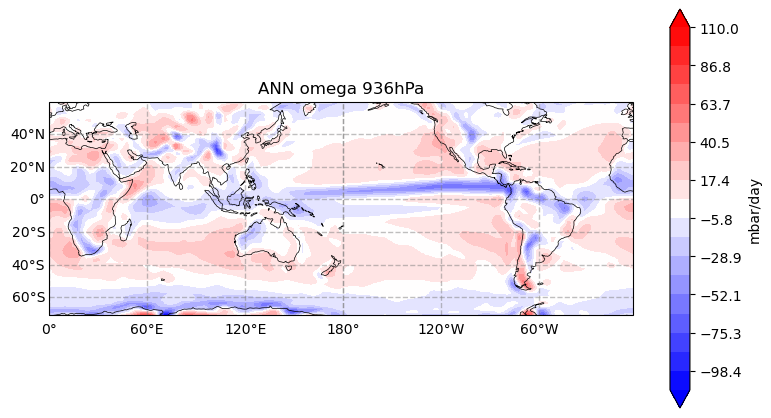

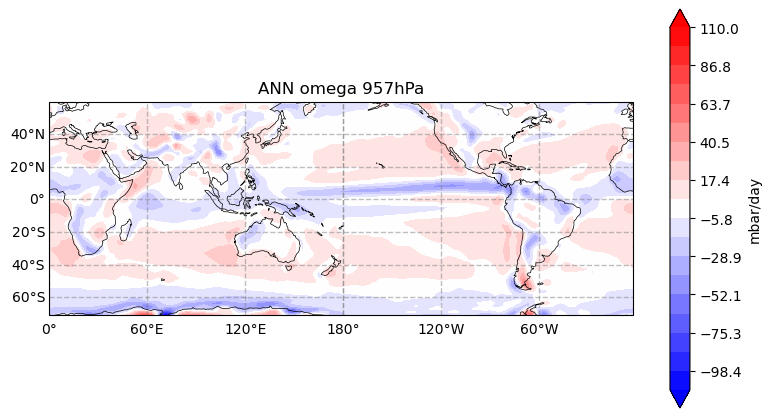

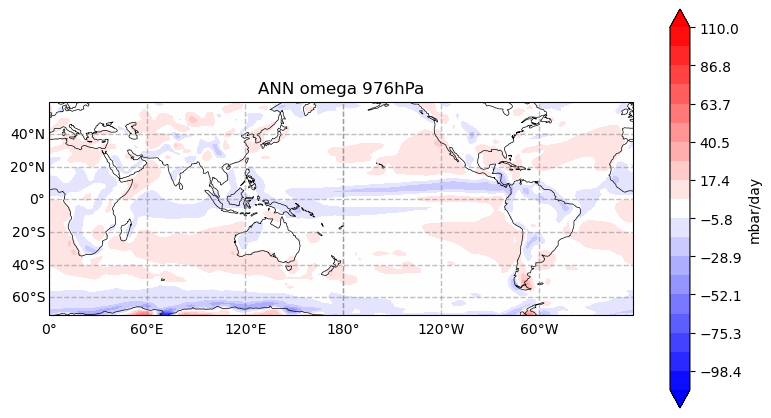

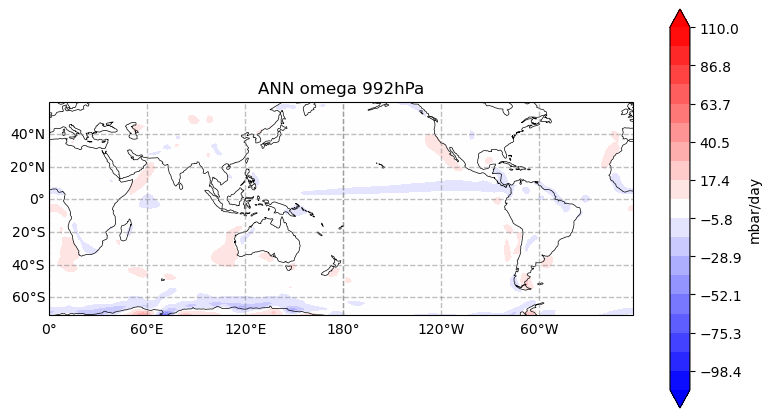

In [19]:
for i in range(0,30):
    fig, ax = plt.subplots(1,1,figsize=(8,6),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    ax.set_title(f"ANN omega {levs[i]:.0f}hPa")
    vmax = 110
    vmin = -110
    plot_spatial(lon, lat[10:80], ann_omega_converted[i,10:80], ax=ax, cbar_label="mbar/day", vmin=vmin, vmax=vmax)
    plt.tight_layout()
    plt.show()

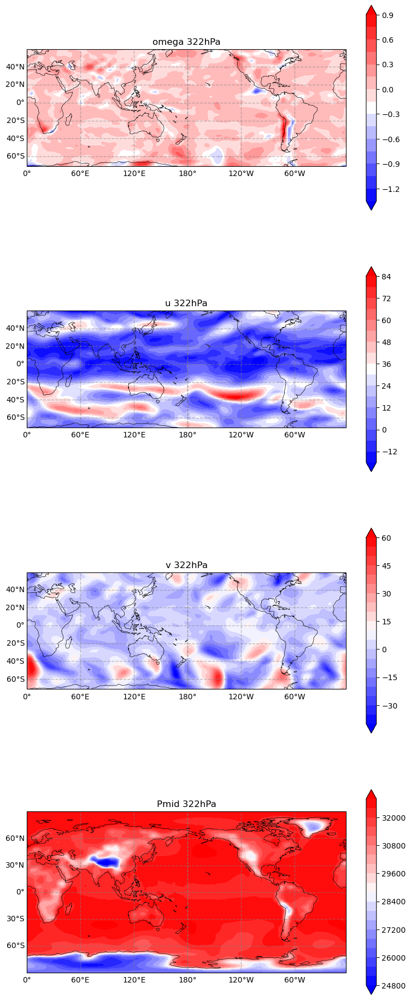

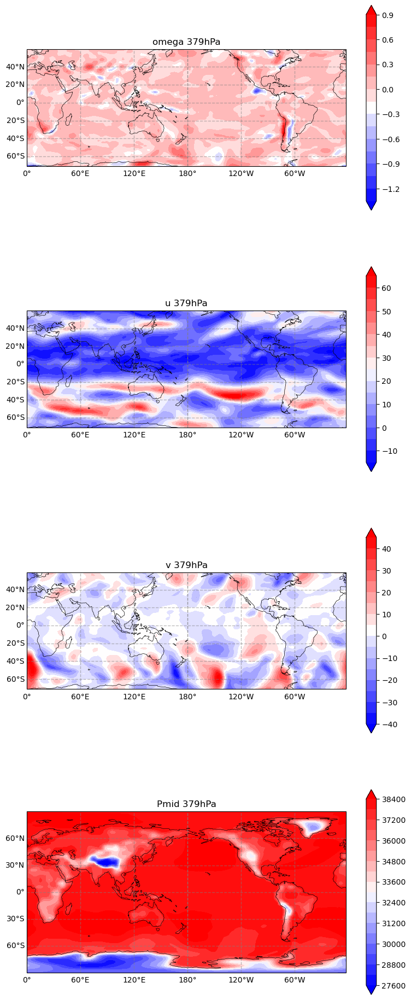

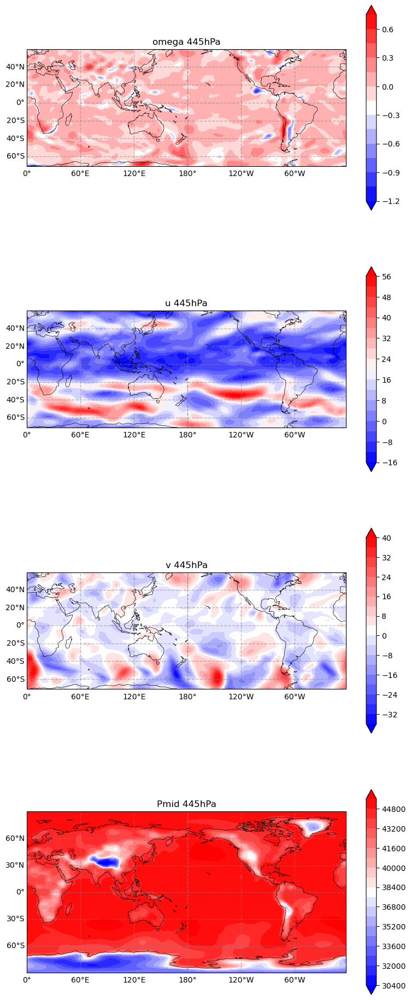

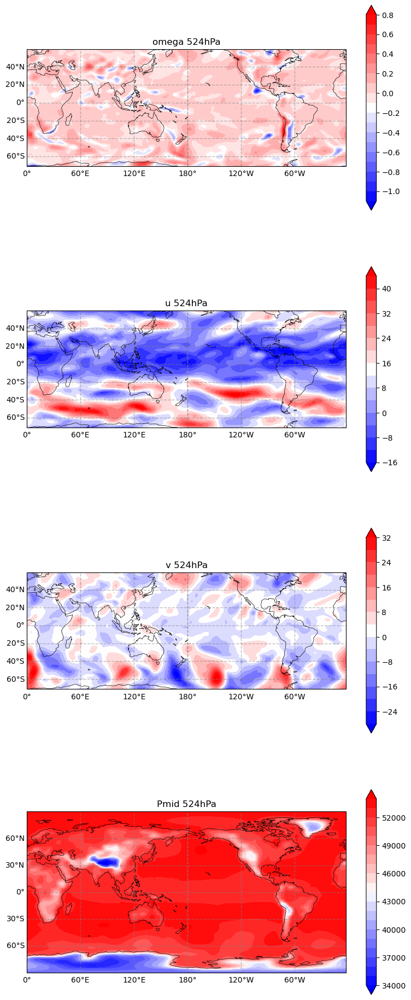

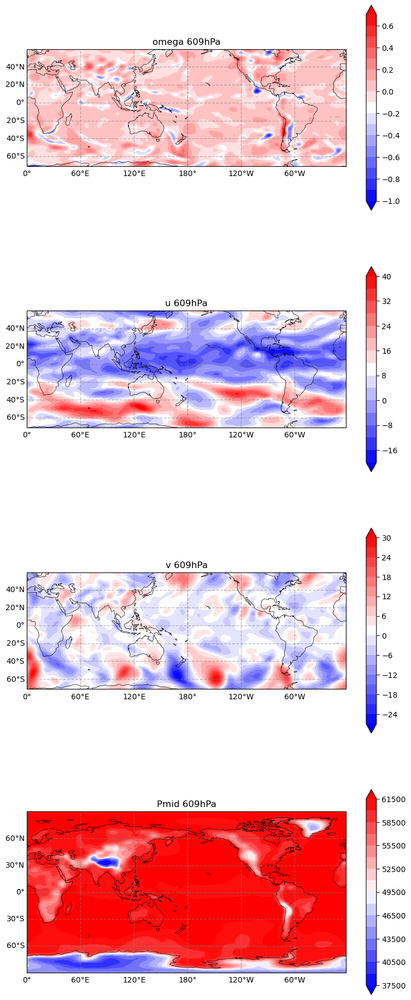

...

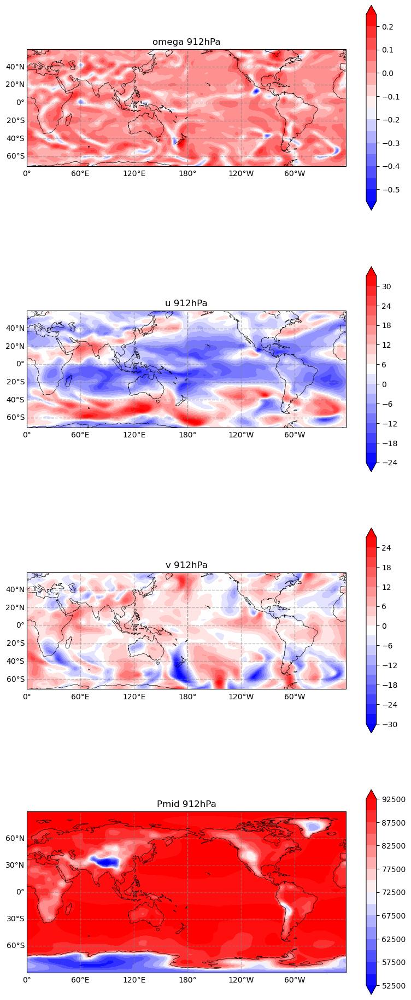

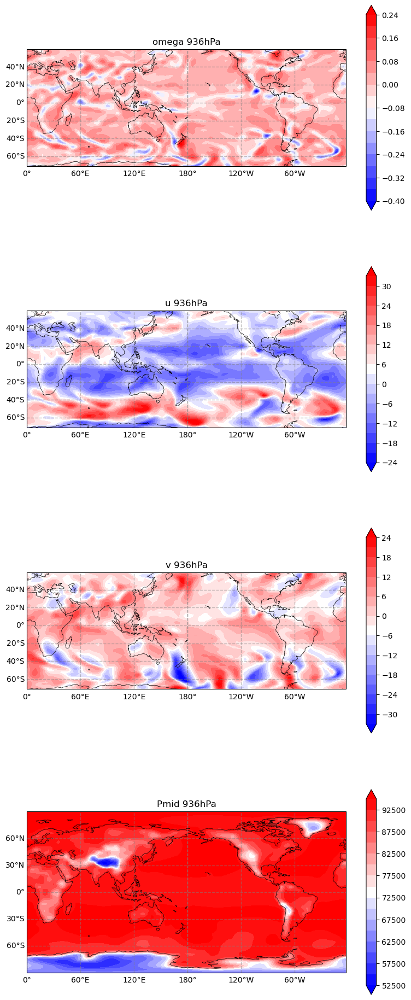

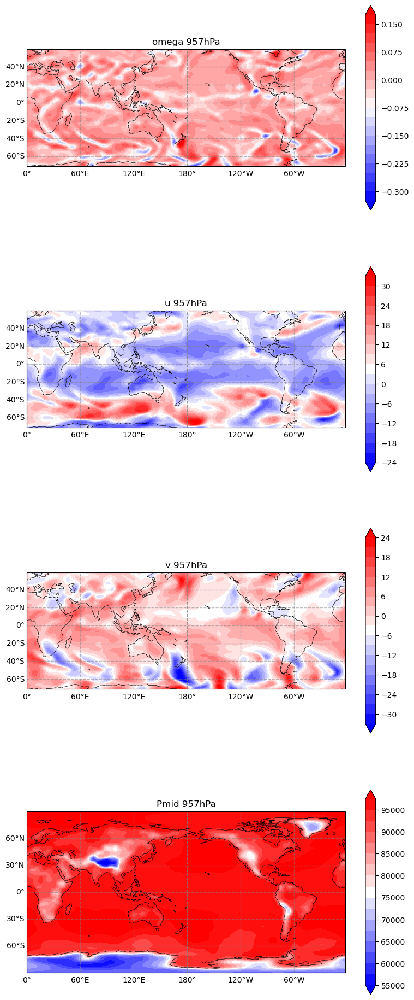

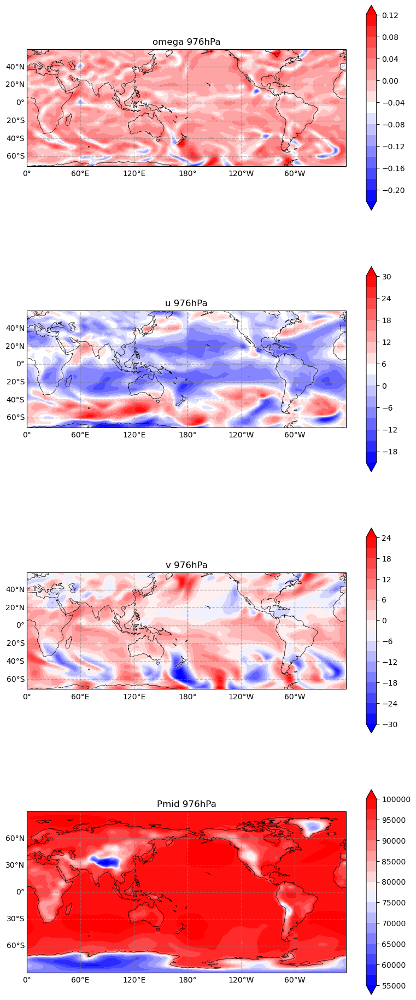

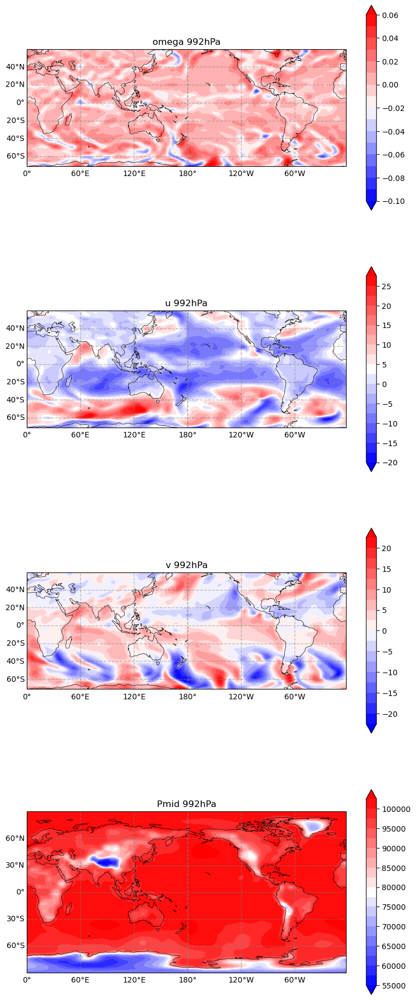

In [6]:
for i in range(15,30):
    fig, ax = plt.subplots(4,1,figsize=(8,20),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    ax[0].set_title(f"omega {levs[i]:.0f}hPa")
    plot_spatial(lon, lat[10:80], omega[i,10:80], ax=ax[0])
    ax[1].set_title(f"u {levs[i]:.0f}hPa")
    plot_spatial(lon, lat[10:80], u[i,10:80], ax=ax[1])
    ax[2].set_title(f"v {levs[i]:.0f}hPa")
    plot_spatial(lon, lat[10:80], v[i,10:80], ax=ax[2])
    ax[3].set_title(f"Pmid {levs[i]:.0f}hPa")
    plot_spatial(lon, lat, pmid[i].astype(int), ax=ax[3])
    plt.tight_layout()
    plt.show()

In [1]:
import xarray as xr

In [8]:
era5 = xr.open_zarr(
    "/Users/jiandachen/Projects/NNCAM_packages/nncam_training/dataloader/test_zarr"
    # chunks={'time': 48},
    # consolidated=True,
)

FileNotFoundError: No such file or directory: '/Users/jiandachen/Projects/NNCAM_packages/nncam_training/dataloader/test_zarr'